USAR KERNEL 3.10.11

Limpieza y Preprocesamiento de Datos con Python
Objetivo: Limpiar y preprocesar los tres datasets para que los datos estén listos para su análisis.

Tareas:

Cargar los tres datasets:

Historicos_Ordenes.csv (Órdenes de trabajo)
Registros_Condiciones.csv (Registros de condiciones operativas)
Caracteristicas_Equipos.csv (Características de los equipos)
Opcional: Cargar los datasets de datalake (ver connection string)

Identificar y manejar valores nulos en las columnas clave (por ejemplo, Costo_Mantenimiento, Temperatura_C y Horas_Operativas).
Eliminar duplicados y corregir inconsistencias de formato (como valores erróneos en campos numéricos).


In [1]:
from Ingestion import carga_datos
ordenes,caracteristicas, registros=carga_datos()


In [37]:
import limpieza_analisis as lg
caracteristicas_cle=lg.limpieza(caracteristicas)

ModuleNotFoundError: No module named 'limpieza_analisis'

Se han detectado 10 equipos con potencia -100 KW, analizar porque ese dato es erroneo

In [9]:
caracteristicas_cle[caracteristicas_cle["Potencia_kW"]==-100]

,ID_Equipo,Tipo_Equipo,Fabricante,Modelo,Potencia_kW,Horas_Recomendadas_Revision
32,33,Motor,Schneider,Y200,-100,5353
58,59,Generador,Schneider,M400,-100,2244
70,71,Compresor,ABB,X100,-100,3150
81,82,Motor,ABB,Z300,-100,8473
156,157,Transformador,ABB,Y200,-100,8496
213,214,Compresor,ABB,Z300,-100,9829
263,264,Transformador,GE,Y200,-100,7318
302,303,Generador,ABB,Y200,-100,7836
320,321,Compresor,ABB,Y200,-100,8230
489,490,Transformador,Siemens,X100,-100,5118


In [ ]:
import limpieza_analisis as lg
registros_cle=lg.limpieza(registros)

columna: "Fecha" cambiado su tipo a Datetime
Columna 'Horas_Operativas' tiene 40 valores NaN. Eliminando Nan de esta columna.
Outliers en la columna: "Temperatura_C" : 30, todos eliminados

TAMAÑO: (8930, 6) 

RESUMEN:
         ID_Registro    ID_Equipo  Fecha                            Temperatura_C    Vibracion_mm_s    Horas_Operativas
-----  -------------  -----------  -----------------------------  ---------------  ----------------  ------------------
count        8930        8930      8930                                 8930             8930                    8930
mean         4499.08      245.323  2020-07-06 10:04:36.147816192          99.6644           2.54077             50438.7
min             1           1      2020-01-01 00:00:00                    50.01             0.1                     0
25%          2247.25      119      2020-04-03 14:15:00                    74.44             1.32                25246
50%          4498.5       243      2020-07-06 09:30:00             

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/anaconda/envs/azureml_py38/lib/python3.10/site-packages/ydata_profiling/profile_report.py:358: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import limpieza_analisis as lg
ordenes_cle=lg.limpieza(ordenes)

columna: "Fecha" cambiado su tipo a Datetime
columna: "Tipo_Mantenimiento", cambiado su tipo de object a category
columna: "Ubicacion", cambiado su tipo de object a category
Columna 'Costo_Mantenimiento' tiene 50 valores NaN. Eliminando Nan de esta columna.
Eliminando 20 duplicados


TAMAÑO: (9950, 7) 

RESUMEN:
         ID_Orden    ID_Equipo  Fecha                            Costo_Mantenimiento    Duracion_Horas
-----  ----------  -----------  -----------------------------  ---------------------  ----------------
count     9950        9950      9950                                         9950            9950
mean      4998.55      250.511  2020-07-27 05:33:17.547738624                4977.34           24.0544
min          1           1      2020-01-01 00:00:00                           100.72            1
25%       2500.25      125      2020-04-14 03:15:00                          2499.26           12
50%       4998.5       252      2020-07-27 05:30:00                          4916.6

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/anaconda/envs/azureml_py38/lib/python3.10/site-packages/ydata_profiling/profile_report.py:358: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]


Agregar nuevas columnas relevantes como:
Frecuencia de mantenimiento: Número de mantenimientos realizados por equipo.
Vida útil estimada: Estimación de la vida útil de los equipos basada en las horas operativas.


Frecuencia de mantenimiento: Número de mantenimientos realizados por equipo

In [5]:
import pandas as pd
# Calcular el conteo de número de órdenes total y número de órdenes de mantenimiento correctivo y preventivo para cada ID_Equipo
conteo_total = ordenes_cle.groupby('ID_Equipo').agg(Total_Ordenes=("ID_Equipo","count"))
conteo_correctivo = ordenes_cle[ordenes_cle['Tipo_Mantenimiento'] == 'Correctivo'].groupby('ID_Equipo').agg(Ordenes_Correctivo=("ID_Equipo","count"))
conteo_preventivo = ordenes_cle[ordenes_cle['Tipo_Mantenimiento'] == 'Preventivo'].groupby('ID_Equipo').agg(Ordenes_Preventivo=("ID_Equipo","count"))

# Unir los conteos en una sola tabla
tabla_resumen = pd.merge(conteo_total, conteo_correctivo, on='ID_Equipo')
tabla_resumen1 = pd.merge(tabla_resumen, conteo_preventivo, on='ID_Equipo')

# Rellenar los valores NaN con 0
resumen_ots = tabla_resumen1.fillna(0)
resumen_ots.sort_values("Total_Ordenes",ascending=False)



,Total_Ordenes,Ordenes_Correctivo,Ordenes_Preventivo
ID_Equipo,,,
172,36,21,15
488,34,11,23
141,33,19,14
443,32,19,13
130,32,14,18
...,...,...,...
7,11,5,6
192,10,6,4
227,9,5,4


Vida útil estimada: Estimación de la vida útil de los equipos basada en las horas operativas. Se asume que la vida útil de cada equipo es el máximo de horas operativas registradas, para ese equipo

In [6]:
vida_util=registros_cle.groupby('ID_Equipo').agg(Vida_util_estimada=("Horas_Operativas","max"))
vida_util

,Vida_util_estimada
ID_Equipo,
1,92645.0
2,91899.0
3,97734.0
4,93640.0
5,99898.0
...,...
495,98566.0
496,90614.0
497,96443.0


Vamos a añadir las tablas anteriores a la tabla REGISTROS_CLE (porque es la unica tabla que tiene un registro por ID de equipo) para crear una nueva tabla

In [7]:
resumen_ots_vida_util=pd.merge(resumen_ots,vida_util, on="ID_Equipo")
resumen_ots_vida_util_caract =pd.merge(caracteristicas_cle,resumen_ots_vida_util, on="ID_Equipo")
resumen_ots_vida_util_caract



,ID_Equipo,Tipo_Equipo,Fabricante,Modelo,Potencia_kW,Horas_Recomendadas_Revision,Total_Ordenes,Ordenes_Correctivo,Ordenes_Preventivo,Vida_util_estimada
0,1,Motor,Schneider,X100,1009,9656,20,10,10,92645.0
1,2,Motor,ABB,Z300,1220,2165,13,7,6,91899.0
2,3,Motor,GE,Y200,3733,6674,16,10,6,97734.0
3,4,Transformador,Siemens,X100,662,1480,20,12,8,93640.0
4,5,Compresor,ABB,Y200,982,4282,17,10,7,99898.0
...,...,...,...,...,...,...,...,...,...,...
494,495,Compresor,Schneider,Y200,4383,6188,23,12,11,98566.0
495,496,Motor,Siemens,X100,3617,5594,21,10,11,90614.0
496,497,Generador,Schneider,Y200,548,8614,22,11,11,96443.0
497,498,Motor,Schneider,M400,2602,5874,21,10,11,91463.0


Hacemos profiling por si hay alguna correlación

In [8]:
import profiling as pr
pr.profiling1(resumen_ots_vida_util_caract)


PROFILING



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/anaconda/envs/azureml_py38/lib/python3.10/site-packages/ydata_profiling/profile_report.py:358: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Aparentemente no hay correlaciones entre las OTs generadas, vida útil del equipo y caracteriaticas del mismo

Resumen de LIMPIEZA y PREPROCESADO:

PARA LA TABLA CARACTERISTICAS:
columna: "Tipo_Equipo", cambiado su tipo de object a category
columna: "Fabricante", cambiado su tipo de object a category
columna: "Modelo", cambiado su tipo de object a category
Eliminando 5 duplicados
TAMAÑO: (500, 6) 

CARDINALIDAD:
Numero de valores únicos por cada columna: {'ID_Equipo': 500, 'Tipo_Equipo': 4, 'Fabricante': 4, 'Modelo': 4, 'Potencia_kW': 471, 'Horas_Recomendadas_Revision': 490} 

ANALIZAR POR QUE LA POTENCIA HAY 10 EQUIPOS CON POTENCIA -100 KW

Correlación: no hay correlacion entre las variables de la tabla
Skew: Nada relevante
Kurtosis: Nada relevante
Para más informacion ver PROFILING "Caracteristicas_profile_report"

PARA LA TABLA REGISTROS:
columna: "Fecha" cambiado su tipo a Datetime
Columna 'Horas_Operativas' tiene 40 valores NaN. Eliminando Nan de esta columna.
Outliers en la columna: "Temperatura_C" : 30, todos eliminados

TAMAÑO: (8930, 6) 
 
CARDINALIDAD:
Numero de valores únicos por cada columna: {'ID_Registro': 8930, 'ID_Equipo': 499, 'Fecha': 8930, 'Temperatura_C': 5896, 'Vibracion_mm_s': 491, 'Horas_Operativas': 8518} 

Correlación: no hay correlacion entre las variables de la tabla
Skew: Nada relevante
Kurtosis: Nada relevante
Para más informacion ver PROFILING "Registros_profile_report"

PARA LA TABLA ORDENES:
columna: "Fecha" cambiado su tipo a Datetime
columna: "Tipo_Mantenimiento", cambiado su tipo de object a category
columna: "Ubicacion", cambiado su tipo de object a category
Columna 'Costo_Mantenimiento' tiene 50 valores NaN. Eliminando Nan de esta columna.
Eliminando 20 duplicados

TAMAÑO: (9950, 7) 

CARDINALIDAD:
Numero de valores únicos por cada columna: {'ID_Orden': 9950, 'ID_Equipo': 499, 'Fecha': 9950, 'Tipo_Mantenimiento': 2, 'Costo_Mantenimiento': 9888, 'Duracion_Horas': 47, 'Ubicacion': 4} 

Correlación: no hay correlacion entre las variables de la tabla
Skew: Nada relevante
Kurtosis: Nada relevante
Para más informacion ver PROFILING "Ordenes_profile_report"


Análisis Exploratorio de Datos con Python
Objetivo: Analizar las relaciones entre las características de los equipos, el historial de órdenes de trabajo y las condiciones operativas.
Tareas:
Realizar un análisis descriptivo de los datos:
Estadísticas básicas como la media, mediana y desviación estándar de las horas operativas, el costo de mantenimiento, y la frecuencia de fallos.
Detectar outliers en las columnas clave (por ejemplo, en Costo_Mantenimiento y Horas_Operativas).
Analizar la distribución de fallos y tipos de mantenimiento (correctivo/preventivo) de los equipos.
Establecer posibles correlaciones entre las variables, como la relación entre las condiciones operativas (temperatura, vibración) y las horas de operación.
Recomendación: Usar técnicas como groupby(), corr(), visualización de histogramas y diagramas de dispersión para detectar patrones y correlaciones.




Estadísticas básicas como la media, mediana y desviación estándar de las horas operativas, el costo de mantenimiento, y la frecuencia de fallos.

HORAS OPERATIVAS TOTALES

In [10]:
media=registros_cle[["Horas_Operativas"]].mean()
desviacion=registros_cle[["Horas_Operativas"]].std()
mediana=registros_cle[["Horas_Operativas"]].median()
print(f"Media: {media}")
print(f"Desviación Estándar: {desviacion}")
print(f"Mediana: {mediana}")

Media: Horas_Operativas    50438.671221
dtype: float64
Desviación Estándar: Horas_Operativas    28972.668828
dtype: float64
Mediana: Horas_Operativas    50823.5
dtype: float64


HORAS OPERATIVAS POR EQUIPO

In [11]:
coste_por_equipo=registros_cle.groupby('ID_Equipo').agg(Horas_Operativas_media=("Horas_Operativas","mean"),Horas_Operativas_mediana=("Horas_Operativas","median"),Horas_Operativas_desv_std=("Horas_Operativas","std"))
print("Horas operativas por equipo:")
coste_por_equipo

Horas operativas por equipo:


,Horas_Operativas_media,Horas_Operativas_mediana,Horas_Operativas_desv_std
ID_Equipo,,,
1,48090.312500,49107.5,26826.731481
2,64532.615385,70479.0,20636.167940
3,42117.111111,36392.5,32927.557618
4,56715.350000,67859.5,27451.827040
5,54120.142857,54806.5,24927.663257
...,...,...,...
495,54310.421053,42321.0,33036.467195
496,46477.541667,44500.0,26526.419864
497,53482.947368,55002.0,25637.112672


COSTE DE MANTENIMIENTO TOTAL

In [12]:
media=ordenes_cle[["Costo_Mantenimiento"]].mean()
desviacion=ordenes_cle[["Costo_Mantenimiento"]].std()
mediana=ordenes_cle[["Costo_Mantenimiento"]].median()
print("El coste de mantenimiento TOTAL:")
print(f"Media: {media}")
print(f"Desviación Estándar: {desviacion}")
print(f"Mediana: {mediana}")

El coste de mantenimiento TOTAL:
Media: Costo_Mantenimiento    4977.342366
dtype: float64
Desviación Estándar: Costo_Mantenimiento    2837.233565
dtype: float64
Mediana: Costo_Mantenimiento    4916.675
dtype: float64


COSTE DE MANTENIMIENTO POR EQUIPO

In [13]:
coste_mto = ordenes_cle[['ID_Equipo',"Costo_Mantenimiento"]].groupby('ID_Equipo').agg(MEDIA=("Costo_Mantenimiento","mean"), MEDIANA=("Costo_Mantenimiento","median"),DESVIACION_STD=("Costo_Mantenimiento","std")).sort_values("MEDIA",ascending=False)
print("El coste de mantenimiento por equipo:")
coste_mto

El coste de mantenimiento por equipo:


,MEDIA,MEDIANA,DESVIACION_STD
ID_Equipo,,,
254,6956.170000,7415.920,2431.751225
299,6790.311667,7767.675,2075.448978
78,6658.467857,6965.445,2168.349573
423,6602.345000,6586.395,2116.637018
242,6513.377143,8114.200,3135.895175
...,...,...,...
447,3527.959600,3458.400,2439.415354
330,3385.696000,1991.310,2920.991691
205,3356.644000,3175.450,2274.641135


FRECUENCIA DE FALLOS (2 VERTIENTES, NUMERO DE FALLOS Y DIAS ENTRE FALLOS CONSECUTIVOS)

NUMERO DE FALLLOS

In [14]:
frecuencia_fallos = ordenes_cle[ordenes_cle['Tipo_Mantenimiento'] == 'Correctivo'].groupby('ID_Equipo').size().reset_index(name='Numero_Fallos')
frecuencia_fallos
media=frecuencia_fallos[["Numero_Fallos"]].mean()
desviacion=frecuencia_fallos[["Numero_Fallos"]].std()
mediana=frecuencia_fallos[["Numero_Fallos"]].median()
print("Numero de fallos por equipo:")
print(f"Media: {media}")
print(f"Desviación Estándar: {desviacion}")
print(f"Mediana: {mediana}")
numero_fallos=frecuencia_fallos.sort_values("Numero_Fallos",ascending=False,ignore_index=True)
numero_fallos

Numero de fallos por equipo:
Media: Numero_Fallos    10.138277
dtype: float64
Desviación Estándar: Numero_Fallos    3.260897
dtype: float64
Mediana: Numero_Fallos    10.0
dtype: float64


,ID_Equipo,Numero_Fallos
0,172,21
1,281,20
2,59,20
3,443,19
4,89,19
...,...,...
494,155,4
495,166,4
496,499,4
497,71,3


DIAS ENTRE FALLOS CONSECUTIVOS (ORDENES DE MTO CORRECTIVO)

In [15]:
import warnings
warnings.filterwarnings('ignore')
ordenes_correctivo = ordenes_cle[ordenes_cle['Tipo_Mantenimiento'] == 'Correctivo']

# Calcular la diferencia de días entre cada orden de mantenimiento correctivo para cada equipo
ordenes_correctivo['Dias_Diferencia'] = ordenes_correctivo.groupby('ID_Equipo')['Fecha'].diff().dt.days
print("Numero de días entre fallos consecutivos")
dias_entre_fallos_consec=ordenes_correctivo[['ID_Equipo',"Dias_Diferencia"]].groupby('ID_Equipo').agg(MEDIA=("Dias_Diferencia","mean"), MEDIANA=("Dias_Diferencia","median"),DESVIACION_STD=("Dias_Diferencia","std")).sort_values("MEDIA",ascending=True)
dias_entre_fallos_consec

Numero de días entre fallos consecutivos


,MEDIA,MEDIANA,DESVIACION_STD
ID_Equipo,,,
297,13.000000,12.0,7.549834
484,16.900000,12.0,18.002778
104,17.285714,13.0,15.274053
443,17.388889,10.0,19.079212
172,18.050000,6.0,21.047503
...,...,...,...
242,89.500000,36.5,122.415958
124,91.000000,62.0,109.062673
260,94.750000,98.5,52.245414


In [16]:
DIAS_ENTRE_FALL_CONSEC=dias_entre_fallos_consec[["MEDIA"]].rename(columns={"MEDIA":"DIAS_ENTRE_FALL_CONSEC"})
DIAS_ENTRE_FALL_CONSEC

,DIAS_ENTRE_FALL_CONSEC
ID_Equipo,
297,13.000000
484,16.900000
104,17.285714
443,17.388889
172,18.050000
...,...
242,89.500000
124,91.000000
260,94.750000


DIAS ENTRE MTOS CONSECUTIVOS (ORDENES DE MTO CORRECTIVO, PREVENTIVO Y TOTALES)

In [17]:
ordenes_preventivo = ordenes_cle[ordenes_cle['Tipo_Mantenimiento'] == 'Preventivo']

# Calcular la diferencia de días entre cada orden de mantenimiento correctivo para cada equipo
ordenes_preventivo['Dias_Diferencia'] = ordenes_preventivo.groupby('ID_Equipo')['Fecha'].diff().dt.days
dias_entre_prev_consec=ordenes_preventivo[['ID_Equipo',"Dias_Diferencia"]].groupby('ID_Equipo').agg(MEDIA_DIAS_ENTRE_MTO_PREV=("Dias_Diferencia","mean"))
dias_entre_prev_consec

diff_dias_todas_ots = ordenes_cle[['ID_Equipo','Fecha']]
diff_dias_todas_ots['Dias_Diferencia'] = diff_dias_todas_ots.groupby('ID_Equipo')['Fecha'].diff().dt.days
print("Numero de días entre MTOS consecutivos, entre MTOS PREV consecutivos y entre MTOS CORR consecutivos")
dias_entre_mto_consec=diff_dias_todas_ots[['Dias_Diferencia','ID_Equipo']].groupby('ID_Equipo').agg(MEDIA_DIAS_ENTRE_MTOS=("Dias_Diferencia","mean"))
dias_entre_mto_consec
mezcla=pd.merge(dias_entre_mto_consec,dias_entre_prev_consec, on="ID_Equipo")
DIAS_ENTRE_OTS=pd.merge(mezcla,DIAS_ENTRE_FALL_CONSEC, on="ID_Equipo")
DIAS_ENTRE_OTS.sort_values("MEDIA_DIAS_ENTRE_MTOS",ascending=True)


Numero de días entre MTOS consecutivos, entre MTOS PREV consecutivos y entre MTOS CORR consecutivos


,MEDIA_DIAS_ENTRE_MTOS,MEDIA_DIAS_ENTRE_MTO_PREV,DIAS_ENTRE_FALL_CONSEC
ID_Equipo,,,
172,10.485714,26.714286,18.050000
443,10.548387,25.833333,17.388889
141,11.562500,28.692308,20.722222
130,11.677419,21.588235,23.692308
488,11.818182,17.954545,30.600000
...,...,...,...
124,36.800000,72.400000,91.000000
192,37.111111,40.000000,55.000000
227,40.750000,66.666667,81.000000


Detectar outliers en las columnas clave (por ejemplo, en Costo_Mantenimiento y Horas_Operativas).
NO SE HAN DETECTADO OUTLIERS EN ESAS COLUMNAS DURANTE LA LIMPIEZA Y PROCESADO (VER PUNTO 1)

Analizar la distribución de fallos y tipos de mantenimiento (correctivo/preventivo) de los equipos
ESTE ANALISIS YA SE HACE EN LA TABLA RESUMEN OTS DONDE SE APRECIA POR CADA EQUIPO EL NUMERO DE OTS GENERADAS DE MANTENIMIENTO PREVENTIVO Y CORRECTIVO

Establecer posibles correlaciones entre las variables, como la relación entre las condiciones operativas (temperatura, vibración) y las horas de operación.

ESTOS PUNTOS  SE ANALIZAN EN EL PROFILING DE LA TABLA FINAL, QUE RECOGE TODAS LAS VARIABLES

3. Mezcla y Combinación de Datos
Objetivo: Combinar los tres datasets en un único conjunto de datos que contenga toda la información relevante de cada equipo, las condiciones operativas y las órdenes de mantenimiento.

Tareas:

Merge: Utilizar la función merge() de pandas para combinar los tres datasets en un único dataframe. Las combinaciones deben realizarse a través de la columna ID_Equipo (o cualquier otro identificador único de equipo).

Asegurarse de que las columnas combinadas estén correctamente alineadas y que no haya valores nulos o duplicados tras la combinación.

Crear nuevas columnas combinadas que representen relaciones clave:

Tiempo hasta fallo: ¿Cuánto tiempo de operación transcurre hasta que un equipo requiere mantenimiento?
Relación entre condiciones operativas y fallos: ¿Cómo impactan la vibración o temperatura en la probabilidad de un fallo?
Recomendación: Usar pandas para realizar los joins o merges y la combinación de datasets, además de limpiar los datos resultantes para asegurarse de que no haya errores en los valores.

PARA ORDENES SACAMOS LA MEDIA DE COSTE Y LA MEDIA DE DURACION DE HORAS DE TODAS LAS ORDENES DE MANTENIMIENTO CORRECTIVO, PREVENTIVO Y TOTAL DEL MISMO EQUIPO

In [19]:
ordenes_total=ordenes_cle[['ID_Equipo',"Costo_Mantenimiento","Duracion_Horas"]].groupby('ID_Equipo').agg(COSTE_MTO_MEDIO_POR_ORDEN=("Costo_Mantenimiento","mean"), DURACION_HORAS_MEDIO_POR_ORDEN=("Duracion_Horas","mean"),COSTE_MTO_TOTAL=("Costo_Mantenimiento","sum"), DURACION_HORAS_TOTAL=("Duracion_Horas","sum"))
ordenes_preventivo = ordenes_cle[ordenes_cle['Tipo_Mantenimiento'] == 'Preventivo']
ordenes_correctivo = ordenes_cle[ordenes_cle['Tipo_Mantenimiento'] == 'Correctivo']
ordenes_preventivo_agg=ordenes_preventivo[['ID_Equipo',"Costo_Mantenimiento","Duracion_Horas"]].groupby('ID_Equipo').agg(COSTE_MTO_PREV_MEDIO_POR_ORDEN=("Costo_Mantenimiento","mean"), DURACION_HORAS_PREV_MEDIO_POR_ORDEN=("Duracion_Horas","mean"),COSTE_MTO_PREV_TOTAL=("Costo_Mantenimiento","sum"), DURACION_HORAS_PREV_TOTAL=("Duracion_Horas","sum"))
ordenes_correctivo_agg=ordenes_correctivo[['ID_Equipo',"Costo_Mantenimiento","Duracion_Horas"]].groupby('ID_Equipo').agg(COSTE_MTO_CORR_MEDIO_POR_ORDEN=("Costo_Mantenimiento","mean"), DURACION_HORAS_CORR_MEDIO_POR_ORDEN=("Duracion_Horas","mean"),COSTE_MTO_CORR_TOTAL=("Costo_Mantenimiento","sum"), DURACION_HORAS_CORR_TOTAL=("Duracion_Horas","sum"))
COSTE_ORDENES_PREV_CORR=pd.merge(ordenes_correctivo_agg,ordenes_preventivo_agg, on="ID_Equipo")
COSTE_ORDENES_PREV_CORR_TOTAL=pd.merge(COSTE_ORDENES_PREV_CORR,ordenes_total, on="ID_Equipo")
COSTE_ORDENES_PREV_CORR_TOTAL


,COSTE_MTO_CORR_MEDIO_POR_ORDEN,DURACION_HORAS_CORR_MEDIO_POR_ORDEN,COSTE_MTO_CORR_TOTAL,DURACION_HORAS_CORR_TOTAL,COSTE_MTO_PREV_MEDIO_POR_ORDEN,DURACION_HORAS_PREV_MEDIO_POR_ORDEN,COSTE_MTO_PREV_TOTAL,DURACION_HORAS_PREV_TOTAL,COSTE_MTO_MEDIO_POR_ORDEN,DURACION_HORAS_MEDIO_POR_ORDEN,COSTE_MTO_TOTAL,DURACION_HORAS_TOTAL
ID_Equipo,,,,,,,,,,,,
1,5284.873000,15.400000,52848.73,154,4448.922000,28.000000,44489.22,280,4866.897500,21.700000,97337.95,434
2,3268.534286,16.857143,22879.74,118,4062.376667,29.666667,24374.26,178,3634.923077,22.769231,47254.00,296
3,2923.602000,12.800000,29236.02,128,5017.603333,20.833333,30105.62,125,3708.852500,15.812500,59341.64,253
4,6895.782500,23.500000,82749.39,282,4553.522500,22.125000,36428.18,177,5958.878500,22.950000,119177.57,459
5,4787.365000,24.400000,47873.65,244,4909.548571,19.714286,34366.84,138,4837.675882,22.470588,82240.49,382
...,...,...,...,...,...,...,...,...,...,...,...,...
495,5908.390833,21.583333,70900.69,259,3985.039091,26.636364,43835.43,293,4988.526957,24.000000,114736.12,552
496,5850.827000,29.300000,58508.27,293,5001.808182,16.454545,55019.89,181,5406.102857,22.571429,113528.16,474
497,4997.465455,21.272727,54972.12,234,4917.139091,26.636364,54088.53,293,4957.302273,23.954545,109060.65,527


PARA REGISTROS SACAMOS LA MEDIA DE TEMPERATURAS, VIBRACIONES POR EQUIPO Y HORAS OPERATIVAS

In [20]:
medias_vib_temp_horas = registros_cle[['ID_Equipo',"Temperatura_C","Vibracion_mm_s","Horas_Operativas"]].groupby('ID_Equipo').agg(MEDIA_TEMP=("Temperatura_C","mean"), MEDIA_VIBR=("Vibracion_mm_s","mean"),MEDIA_HORAS_OPERATIVAS=("Horas_Operativas","mean"))
medias_vib_temp_horas

,MEDIA_TEMP,MEDIA_VIBR,MEDIA_HORAS_OPERATIVAS
ID_Equipo,,,
1,106.908125,2.346250,48090.312500
2,95.310000,2.400769,64532.615385
3,93.922778,3.232222,42117.111111
4,90.881500,2.278500,56715.350000
5,107.714643,2.693214,54120.142857
...,...,...,...
495,105.388947,2.308947,54310.421053
496,91.598750,2.845000,46477.541667
497,114.621053,2.642105,53482.947368


UNIMOS LA INFO DE LOS REGISTROS Y DE LAS OTS

In [21]:
AUX2=pd.merge(medias_vib_temp_horas,COSTE_ORDENES_PREV_CORR_TOTAL, on="ID_Equipo")
AUX2

,MEDIA_TEMP,MEDIA_VIBR,MEDIA_HORAS_OPERATIVAS,COSTE_MTO_CORR_MEDIO_POR_ORDEN,DURACION_HORAS_CORR_MEDIO_POR_ORDEN,COSTE_MTO_CORR_TOTAL,DURACION_HORAS_CORR_TOTAL,COSTE_MTO_PREV_MEDIO_POR_ORDEN,DURACION_HORAS_PREV_MEDIO_POR_ORDEN,COSTE_MTO_PREV_TOTAL,DURACION_HORAS_PREV_TOTAL,COSTE_MTO_MEDIO_POR_ORDEN,DURACION_HORAS_MEDIO_POR_ORDEN,COSTE_MTO_TOTAL,DURACION_HORAS_TOTAL
ID_Equipo,,,,,,,,,,,,,,,
1,106.908125,2.346250,48090.312500,5284.873000,15.400000,52848.73,154,4448.922000,28.000000,44489.22,280,4866.897500,21.700000,97337.95,434
2,95.310000,2.400769,64532.615385,3268.534286,16.857143,22879.74,118,4062.376667,29.666667,24374.26,178,3634.923077,22.769231,47254.00,296
3,93.922778,3.232222,42117.111111,2923.602000,12.800000,29236.02,128,5017.603333,20.833333,30105.62,125,3708.852500,15.812500,59341.64,253
4,90.881500,2.278500,56715.350000,6895.782500,23.500000,82749.39,282,4553.522500,22.125000,36428.18,177,5958.878500,22.950000,119177.57,459
5,107.714643,2.693214,54120.142857,4787.365000,24.400000,47873.65,244,4909.548571,19.714286,34366.84,138,4837.675882,22.470588,82240.49,382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,105.388947,2.308947,54310.421053,5908.390833,21.583333,70900.69,259,3985.039091,26.636364,43835.43,293,4988.526957,24.000000,114736.12,552
496,91.598750,2.845000,46477.541667,5850.827000,29.300000,58508.27,293,5001.808182,16.454545,55019.89,181,5406.102857,22.571429,113528.16,474
497,114.621053,2.642105,53482.947368,4997.465455,21.272727,54972.12,234,4917.139091,26.636364,54088.53,293,4957.302273,23.954545,109060.65,527


AÑADIMOS LA INFORMACION YA EXTRAIDA COMO DIAS ENTRE OTS CONSECUTIVOS, VIDA UTIL ESTIMADA

In [22]:
AUX3=pd.merge(resumen_ots,DIAS_ENTRE_OTS, on="ID_Equipo")
AUX3

,Total_Ordenes,Ordenes_Correctivo,Ordenes_Preventivo,MEDIA_DIAS_ENTRE_MTOS,MEDIA_DIAS_ENTRE_MTO_PREV,DIAS_ENTRE_FALL_CONSEC
ID_Equipo,,,,,,
1,20,10,10,18.263158,32.777778,39.111111
2,13,7,6,31.750000,72.000000,55.333333
3,16,10,6,26.600000,63.800000,41.666667
4,20,12,8,19.684211,42.142857,34.454545
5,17,10,7,22.625000,61.000000,38.000000
...,...,...,...,...,...,...
495,23,12,11,16.636364,32.600000,29.909091
496,21,10,11,17.700000,31.500000,40.000000
497,22,11,11,18.095238,35.000000,35.700000


In [23]:
AUX4=pd.merge(AUX3,vida_util, on="ID_Equipo")
AUX4

,Total_Ordenes,Ordenes_Correctivo,Ordenes_Preventivo,MEDIA_DIAS_ENTRE_MTOS,MEDIA_DIAS_ENTRE_MTO_PREV,DIAS_ENTRE_FALL_CONSEC,Vida_util_estimada
ID_Equipo,,,,,,,
1,20,10,10,18.263158,32.777778,39.111111,92645.0
2,13,7,6,31.750000,72.000000,55.333333,91899.0
3,16,10,6,26.600000,63.800000,41.666667,97734.0
4,20,12,8,19.684211,42.142857,34.454545,93640.0
5,17,10,7,22.625000,61.000000,38.000000,99898.0
...,...,...,...,...,...,...,...
495,23,12,11,16.636364,32.600000,29.909091,98566.0
496,21,10,11,17.700000,31.500000,40.000000,90614.0
497,22,11,11,18.095238,35.000000,35.700000,96443.0


UNIMOS TODAS LAS TABLAS CON LA INFOIRMACION CALCULADA

In [24]:
AUX5=pd.merge(AUX4,AUX2, on="ID_Equipo")
AUX5

,Total_Ordenes,Ordenes_Correctivo,Ordenes_Preventivo,MEDIA_DIAS_ENTRE_MTOS,MEDIA_DIAS_ENTRE_MTO_PREV,DIAS_ENTRE_FALL_CONSEC,Vida_util_estimada,MEDIA_TEMP,MEDIA_VIBR,MEDIA_HORAS_OPERATIVAS,...,COSTE_MTO_CORR_TOTAL,DURACION_HORAS_CORR_TOTAL,COSTE_MTO_PREV_MEDIO_POR_ORDEN,DURACION_HORAS_PREV_MEDIO_POR_ORDEN,COSTE_MTO_PREV_TOTAL,DURACION_HORAS_PREV_TOTAL,COSTE_MTO_MEDIO_POR_ORDEN,DURACION_HORAS_MEDIO_POR_ORDEN,COSTE_MTO_TOTAL,DURACION_HORAS_TOTAL
ID_Equipo,,,,,,,,,,,,,,,,,,,,,
1,20,10,10,18.263158,32.777778,39.111111,92645.0,106.908125,2.346250,48090.312500,...,52848.73,154,4448.922000,28.000000,44489.22,280,4866.897500,21.700000,97337.95,434
2,13,7,6,31.750000,72.000000,55.333333,91899.0,95.310000,2.400769,64532.615385,...,22879.74,118,4062.376667,29.666667,24374.26,178,3634.923077,22.769231,47254.00,296
3,16,10,6,26.600000,63.800000,41.666667,97734.0,93.922778,3.232222,42117.111111,...,29236.02,128,5017.603333,20.833333,30105.62,125,3708.852500,15.812500,59341.64,253
4,20,12,8,19.684211,42.142857,34.454545,93640.0,90.881500,2.278500,56715.350000,...,82749.39,282,4553.522500,22.125000,36428.18,177,5958.878500,22.950000,119177.57,459
5,17,10,7,22.625000,61.000000,38.000000,99898.0,107.714643,2.693214,54120.142857,...,47873.65,244,4909.548571,19.714286,34366.84,138,4837.675882,22.470588,82240.49,382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,23,12,11,16.636364,32.600000,29.909091,98566.0,105.388947,2.308947,54310.421053,...,70900.69,259,3985.039091,26.636364,43835.43,293,4988.526957,24.000000,114736.12,552
496,21,10,11,17.700000,31.500000,40.000000,90614.0,91.598750,2.845000,46477.541667,...,58508.27,293,5001.808182,16.454545,55019.89,181,5406.102857,22.571429,113528.16,474
497,22,11,11,18.095238,35.000000,35.700000,96443.0,114.621053,2.642105,53482.947368,...,54972.12,234,4917.139091,26.636364,54088.53,293,4957.302273,23.954545,109060.65,527


UNIMOS LA INFORMACION CALCULADA  A LA TABLA CARACTERISTICAS

In [25]:
TABLA_FINAL=pd.merge(AUX5,caracteristicas_cle, on="ID_Equipo")
TABLA_FINAL

,ID_Equipo,Total_Ordenes,Ordenes_Correctivo,Ordenes_Preventivo,MEDIA_DIAS_ENTRE_MTOS,MEDIA_DIAS_ENTRE_MTO_PREV,DIAS_ENTRE_FALL_CONSEC,Vida_util_estimada,MEDIA_TEMP,MEDIA_VIBR,...,DURACION_HORAS_PREV_TOTAL,COSTE_MTO_MEDIO_POR_ORDEN,DURACION_HORAS_MEDIO_POR_ORDEN,COSTE_MTO_TOTAL,DURACION_HORAS_TOTAL,Tipo_Equipo,Fabricante,Modelo,Potencia_kW,Horas_Recomendadas_Revision
0,1,20,10,10,18.263158,32.777778,39.111111,92645.0,106.908125,2.346250,...,280,4866.897500,21.700000,97337.95,434,Motor,Schneider,X100,1009,9656
1,2,13,7,6,31.750000,72.000000,55.333333,91899.0,95.310000,2.400769,...,178,3634.923077,22.769231,47254.00,296,Motor,ABB,Z300,1220,2165
2,3,16,10,6,26.600000,63.800000,41.666667,97734.0,93.922778,3.232222,...,125,3708.852500,15.812500,59341.64,253,Motor,GE,Y200,3733,6674
3,4,20,12,8,19.684211,42.142857,34.454545,93640.0,90.881500,2.278500,...,177,5958.878500,22.950000,119177.57,459,Transformador,Siemens,X100,662,1480
4,5,17,10,7,22.625000,61.000000,38.000000,99898.0,107.714643,2.693214,...,138,4837.675882,22.470588,82240.49,382,Compresor,ABB,Y200,982,4282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,495,23,12,11,16.636364,32.600000,29.909091,98566.0,105.388947,2.308947,...,293,4988.526957,24.000000,114736.12,552,Compresor,Schneider,Y200,4383,6188
495,496,21,10,11,17.700000,31.500000,40.000000,90614.0,91.598750,2.845000,...,181,5406.102857,22.571429,113528.16,474,Motor,Siemens,X100,3617,5594
496,497,22,11,11,18.095238,35.000000,35.700000,96443.0,114.621053,2.642105,...,293,4957.302273,23.954545,109060.65,527,Generador,Schneider,Y200,548,8614
497,498,21,10,11,19.500000,37.300000,33.888889,91463.0,100.603333,2.572667,...,248,5544.400000,23.523810,116432.40,494,Motor,Schneider,M400,2602,5874


HACEMOS EL PROFILING EN BUSCA DE CORRELACIONES

In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(TABLA_FINAL, title="REPORTE_TOTAL_DE MANTENIMIENTO")
profile.to_notebook_iframe()
profile.to_file('REPORTE_TOTAL_DE MANTENIMIENTO.html')

Crear gráficas de barras para mostrar la distribución del costo de mantenimiento por tipo de equipo

In [26]:
TABLA_FINAL_AGG_TIPO_EQUIPO = TABLA_FINAL[['Tipo_Equipo',"COSTE_MTO_TOTAL","COSTE_MTO_MEDIO_POR_ORDEN"]].groupby('Tipo_Equipo').agg(COSTE_MTO_TOTAL=("COSTE_MTO_TOTAL","mean"), COSTE_MTO_MEDIO_POR_ORDEN=("COSTE_MTO_MEDIO_POR_ORDEN","mean"))
TABLA_FINAL_AGG_TIPO_EQUIPO

,COSTE_MTO_TOTAL,COSTE_MTO_MEDIO_POR_ORDEN
Tipo_Equipo,,
Compresor,99892.785041,5020.349028
Generador,101696.919778,5028.772744
Motor,97023.788898,4910.467472
Transformador,98077.106320,4975.771080


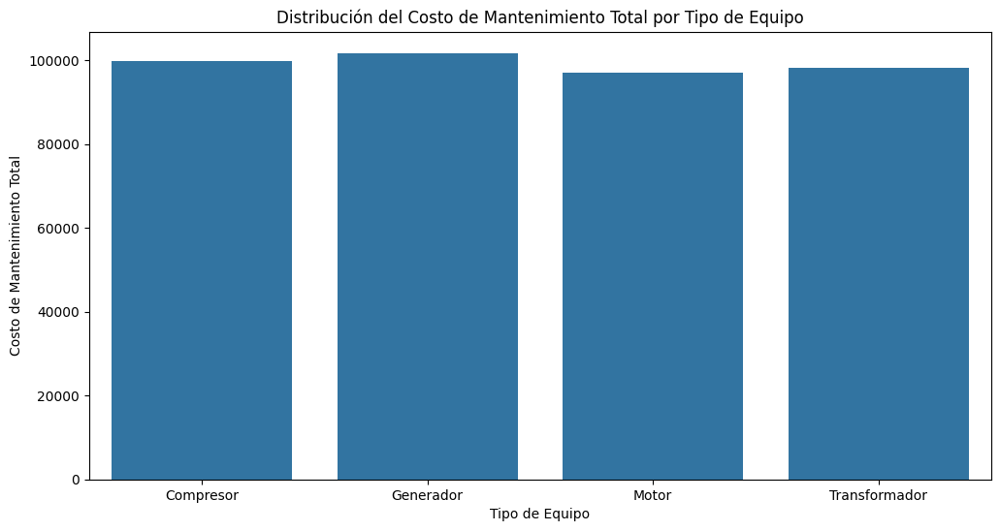

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.figure(figsize=(12,6))
sns.barplot(x='Tipo_Equipo', y='COSTE_MTO_TOTAL', data=TABLA_FINAL_AGG_TIPO_EQUIPO)
plt.title('Distribución del Costo de Mantenimiento Total por Tipo de Equipo')
plt.xlabel('Tipo de Equipo')
plt.ylabel('Costo de Mantenimiento Total')
plt.show()

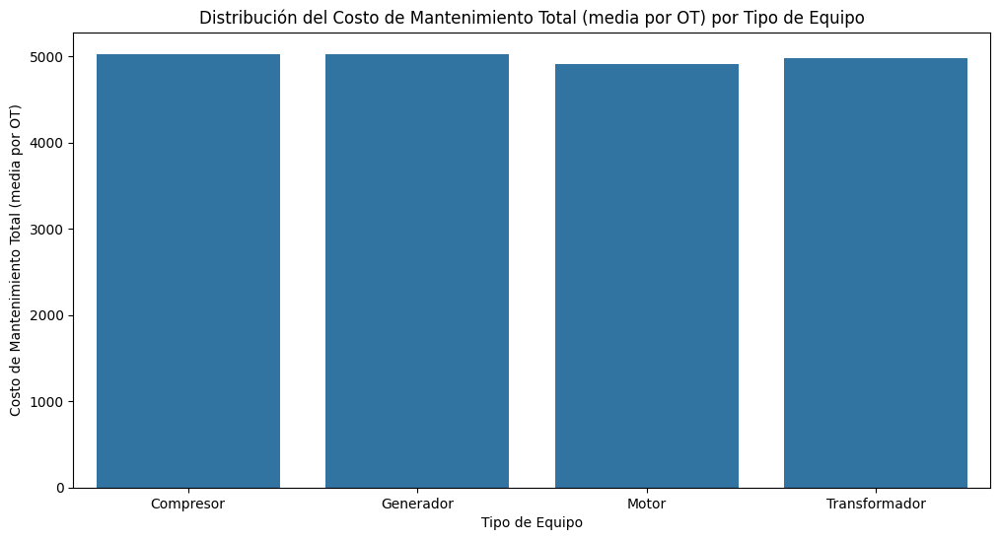

In [28]:
plt.figure(figsize=(12,6))
sns.barplot(x='Tipo_Equipo', y='COSTE_MTO_MEDIO_POR_ORDEN', data=TABLA_FINAL_AGG_TIPO_EQUIPO)
plt.title('Distribución del Costo de Mantenimiento Total (media por OT) por Tipo de Equipo')
plt.xlabel('Tipo de Equipo')
plt.ylabel('Costo de Mantenimiento Total (media por OT)')
plt.show()

Crear diagramas de dispersión para visualizar la relación entre las condiciones operativas (por ejemplo, temperatura y vibración) y las horas de operación o fallos

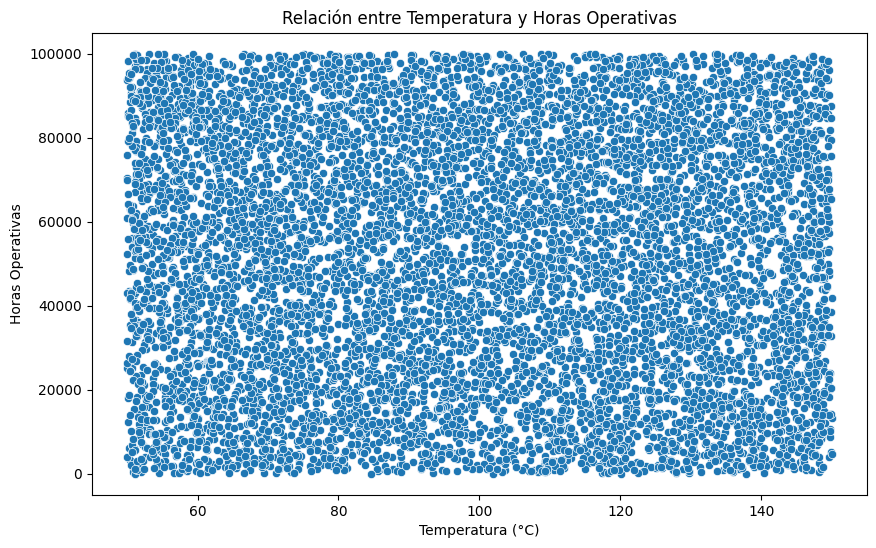

In [29]:
# Relación entre Temperatura y Horas Operativas
plt.figure(figsize=(10,6))
sns.scatterplot(x='Temperatura_C', y='Horas_Operativas', data=registros_cle)
plt.title('Relación entre Temperatura y Horas Operativas')
plt.xlabel('Temperatura (°C)')
plt.ylabel('Horas Operativas')
plt.show()

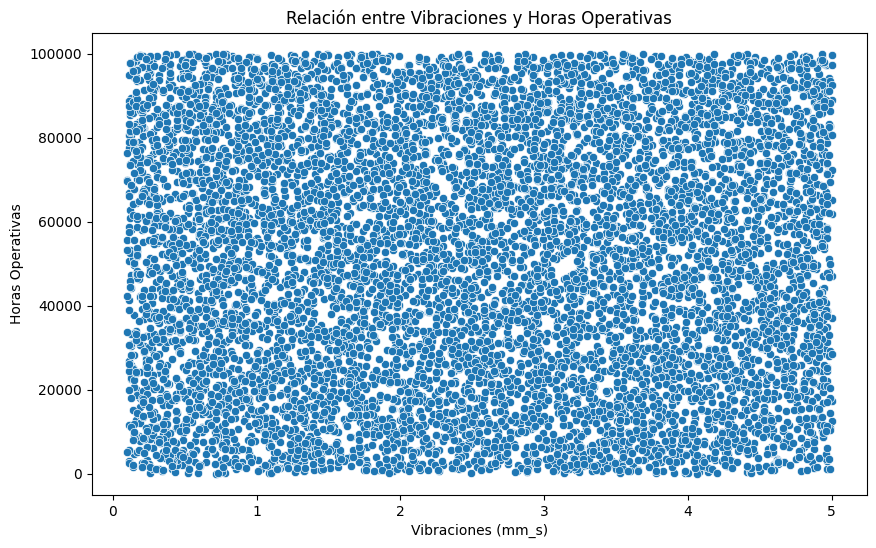

In [30]:
# Relación entre Vibraciones y Horas Operativas
plt.figure(figsize=(10,6))
sns.scatterplot(x='Vibracion_mm_s', y='Horas_Operativas', data=registros_cle)
plt.title('Relación entre Vibraciones y Horas Operativas')
plt.xlabel('Vibraciones (mm_s)')
plt.ylabel('Horas Operativas')
plt.show()

PARA BUSCAR RELACIONES ENTRE VIBRACIONES, TEMPERATURAS Y FALLOS TRAEMOS LA COLUMNA DIAS ENTRE FALOS CONSECUTIVOS, COMO INDICADSOR DE FALLOS

In [31]:
VIB_TEMP_FALLOS=pd.merge(registros_cle,TABLA_FINAL[["DIAS_ENTRE_FALL_CONSEC","ID_Equipo"]], on="ID_Equipo")
VIB_TEMP_FALLOS

,ID_Registro,ID_Equipo,Fecha,Temperatura_C,Vibracion_mm_s,Horas_Operativas,DIAS_ENTRE_FALL_CONSEC
0,1,147,2020-01-01 00:00:00,124.61,3.49,61609.0,24.500000
1,2,111,2020-01-01 01:00:00,58.12,3.62,49474.0,30.250000
2,3,475,2020-01-01 02:00:00,124.86,3.36,59760.0,46.250000
3,4,337,2020-01-01 03:00:00,110.45,1.56,27752.0,32.583333
4,5,212,2020-01-01 04:00:00,70.53,4.89,33066.0,31.300000
...,...,...,...,...,...,...,...
8925,8996,201,2021-01-09 19:00:00,112.75,1.07,56253.0,24.333333
8926,8997,475,2021-01-09 20:00:00,50.67,3.28,27276.0,46.250000
8927,8998,96,2021-01-09 21:00:00,133.86,0.74,75860.0,29.272727
8928,8999,449,2021-01-09 22:00:00,84.72,1.77,11775.0,30.000000


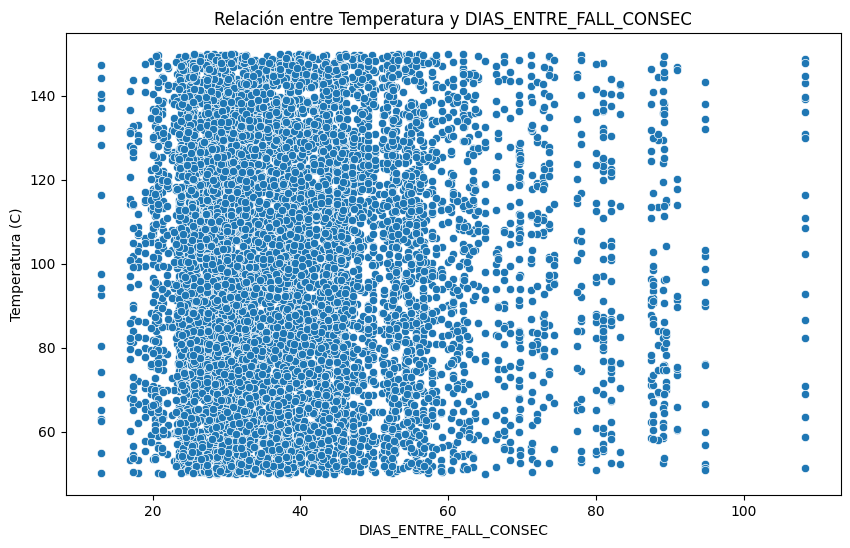

In [32]:
# Relación entre Temperatura y DIAS_ENTRE_FALL_CONSEC
plt.figure(figsize=(10,6))
sns.scatterplot(x='DIAS_ENTRE_FALL_CONSEC', y='Temperatura_C', data=VIB_TEMP_FALLOS)
plt.title('Relación entre Temperatura y DIAS_ENTRE_FALL_CONSEC')
plt.xlabel('DIAS_ENTRE_FALL_CONSEC')
plt.ylabel('Temperatura (C)')
plt.show()

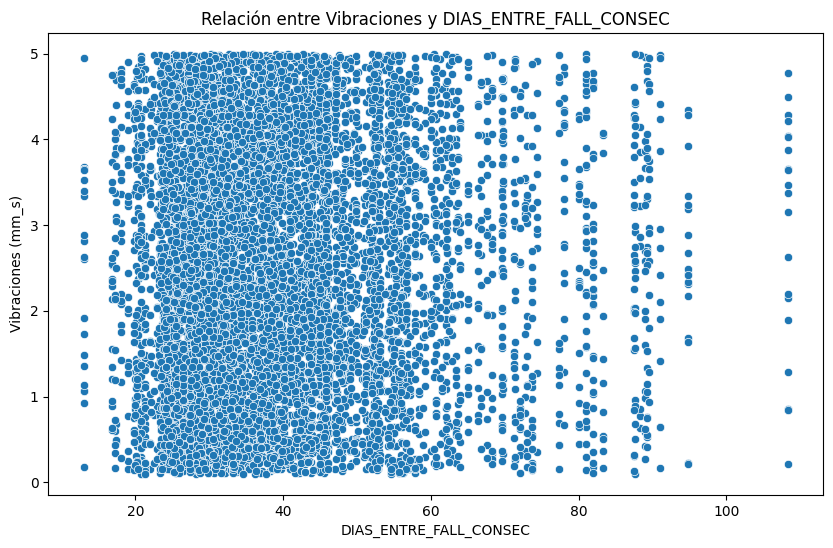

In [33]:
# Relación entre Vibraciones y DIAS_ENTRE_FALL_CONSEC
plt.figure(figsize=(10,6))
sns.scatterplot(x='DIAS_ENTRE_FALL_CONSEC', y='Vibracion_mm_s', data=VIB_TEMP_FALLOS)
plt.title('Relación entre Vibraciones y DIAS_ENTRE_FALL_CONSEC')
plt.xlabel('DIAS_ENTRE_FALL_CONSEC')
plt.ylabel('Vibraciones (mm_s)')
plt.show()

Crear un diagrama de caja para identificar los outliers en las horas operativas o costos de mantenimiento

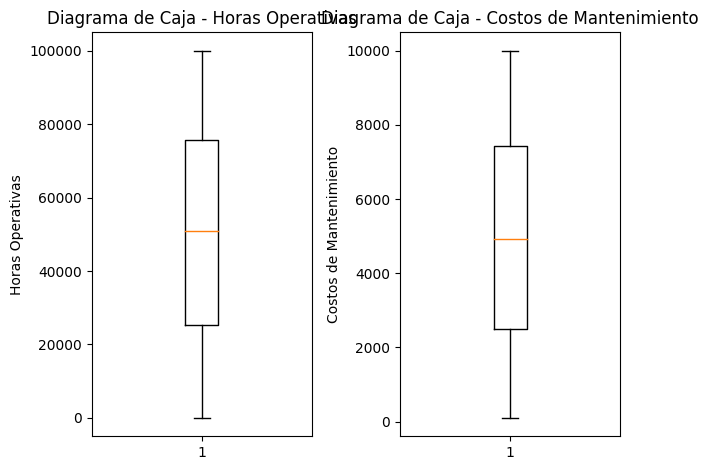

In [34]:
# Diagrama de caja para Horas Operativas
plt.subplot(1, 2, 1)
plt.boxplot(registros_cle['Horas_Operativas'], showfliers=True)
plt.title('Diagrama de Caja - Horas Operativas')
plt.ylabel('Horas Operativas')

# Diagrama de caja para Costos de Mantenimiento
plt.subplot(1, 2, 2)
plt.boxplot(ordenes_cle['Costo_Mantenimiento'], showfliers=True)
plt.title('Diagrama de Caja - Costos de Mantenimiento')
plt.ylabel('Costos de Mantenimiento')

plt.tight_layout()
plt.show()

Generar una visualización de la frecuencia de mantenimiento por tipo de equipo y la relación con el tipo de mantenimiento (correctivo/preventivo)

In [35]:
FREC_MTO_TIPO_EQUIPO_TIPO_MANT=pd.merge(ordenes_cle,caracteristicas_cle, on="ID_Equipo")
FREC_MTO_TIPO_EQUIPO_TIPO_MANT1=FREC_MTO_TIPO_EQUIPO_TIPO_MANT[['Tipo_Mantenimiento','Fecha','Tipo_Equipo']]
FREC_MTO_TIPO_EQUIPO_TIPO_MANT1

,Tipo_Mantenimiento,Fecha,Tipo_Equipo
0,Correctivo,2020-01-01 00:00:00,Compresor
1,Correctivo,2020-01-01 01:00:00,Transformador
2,Correctivo,2020-01-01 02:00:00,Compresor
3,Correctivo,2020-01-01 03:00:00,Generador
4,Correctivo,2020-01-01 04:00:00,Generador
...,...,...,...
9945,Preventivo,2021-02-20 11:00:00,Generador
9946,Correctivo,2021-02-20 12:00:00,Compresor
9947,Correctivo,2021-02-20 13:00:00,Motor
9948,Preventivo,2021-02-20 14:00:00,Transformador


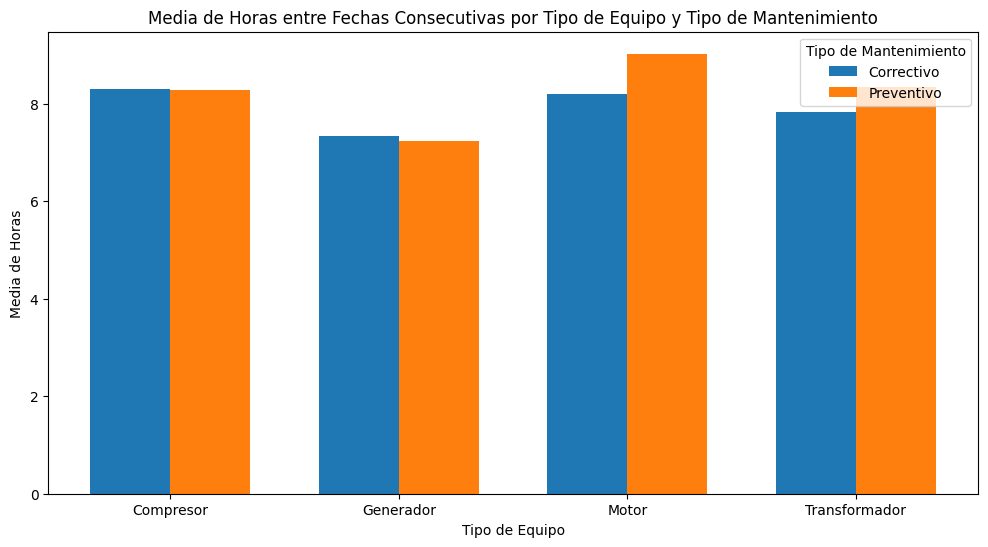

In [36]:
import numpy as np
# Convertir la columna de fechas a tipo datetime
FREC_MTO_TIPO_EQUIPO_TIPO_MANT1['Fecha'] = pd.to_datetime(FREC_MTO_TIPO_EQUIPO_TIPO_MANT1['Fecha'])

# Ordenar el DataFrame por Tipo_Equipo, Tipo_Mantenimiento y Fecha
FREC_MTO_TIPO_EQUIPO_TIPO_MANT2 = FREC_MTO_TIPO_EQUIPO_TIPO_MANT1.sort_values(by=['Tipo_Equipo', 'Tipo_Mantenimiento', 'Fecha'])
FREC_MTO_TIPO_EQUIPO_TIPO_MANT2.head(50)

# Calcular la diferencia de días entre fechas consecutivas
FREC_MTO_TIPO_EQUIPO_TIPO_MANT2['Diferencia_Horas'] = FREC_MTO_TIPO_EQUIPO_TIPO_MANT2.groupby(['Tipo_Equipo', 'Tipo_Mantenimiento'])['Fecha'].diff().dt.total_seconds() / 3600
FREC_MTO_TIPO_EQUIPO_TIPO_MANT2
# Calcular la media de días entre fechas consecutivas para cada tipo de equipo y cada tipo de mantenimiento
media_horas = FREC_MTO_TIPO_EQUIPO_TIPO_MANT2.groupby(['Tipo_Equipo', 'Tipo_Mantenimiento'])['Diferencia_Horas'].mean().reset_index()
media_horas

# Crear un gráfico de barras con los resultados
plt.figure(figsize=(12, 6))
bar_width = 0.35
index = np.arange(len(media_horas['Tipo_Equipo'].unique()))

correctivo_means = media_horas[media_horas['Tipo_Mantenimiento'] == 'Correctivo']['Diferencia_Horas']
preventivo_means = media_horas[media_horas['Tipo_Mantenimiento'] == 'Preventivo']['Diferencia_Horas']

plt.bar(index, correctivo_means, bar_width, label='Correctivo')
plt.bar(index + bar_width, preventivo_means, bar_width, label='Preventivo')

plt.title('Media de Horas entre Fechas Consecutivas por Tipo de Equipo y Tipo de Mantenimiento')
plt.xlabel('Tipo de Equipo')
plt.ylabel('Media de Horas')
plt.xticks(index + bar_width / 2, media_horas['Tipo_Equipo'].unique())
plt.legend(title='Tipo de Mantenimiento')
plt.show()

GUARDAMOPS LOS ARCHIVOS EN FORMATO PARQUET CARPETA OUTPUT

In [38]:
ordenes_cle.to_parquet( '../output/ordenes.parquet')
 

In [39]:
registros_cle.to_parquet( '../output/registros.parquet')

In [40]:
caracteristicas_cle.to_parquet( '../output/caracteristicas.parquet')

In [41]:
TABLA_FINAL.to_parquet( '../output/tabla_final.parquet')